<a href="https://colab.research.google.com/github/UznetDev/NT-M5-H1-Smoking-Cmpetition/blob/main/EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# EDA

*This notebook is created for analyzing the smoking dataset in the smoking competition; in this notebook, data has been analyzed and new features have been created.*

## import necessary lebrary

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px
from sklearn.model_selection import learning_curve
from sklearn.linear_model import (LogisticRegression,
                                  RidgeClassifier,
                                  SGDClassifier,
                                  Perceptron,
                                  PassiveAggressiveClassifier)
from sklearn.naive_bayes import (GaussianNB,
                                 MultinomialNB,
                                 BernoulliNB,
                                 ComplementNB)
from sklearn.neighbors import (KNeighborsClassifier,
                               NearestCentroid)
from sklearn.svm import (SVC,
                         LinearSVC,
                         NuSVC)
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (RandomForestClassifier,
                              GradientBoostingClassifier,
                              AdaBoostClassifier,
                              BaggingClassifier,
                              ExtraTreesClassifier)
from sklearn.discriminant_analysis import (LinearDiscriminantAnalysis,
                                           QuadraticDiscriminantAnalysis)
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import StratifiedKFold
import warnings
warnings.filterwarnings('ignore')

## load data

In [ ]:
train_df = pd.read_csv('train.csv')
test_df = pd.read_csv('test.csv')
train_df.head(1)

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,0,55.0,170.0,80.0,92.0,1.2,0.8,1.0,1.0,129.0,...,49.0,114.0,15.4,1.0,0.9,20.0,23.0,13.0,0.0,0.0


## Functions

In [ ]:
def show_plot(train_data: pd.DataFrame, test_data: pd.DataFrame, columns: str, hue='smoking'):
    fig = make_subplots(rows=2, cols=2, subplot_titles=[
        "Train Data Histogram", "Test Data Histogram",
        "Train Data Box Plot", "Test Data Box Plot"
    ], vertical_spacing=0.2, horizontal_spacing=0.1)

    for category in train_data[hue].unique():
        fig.add_trace(
            go.Histogram(
                x=train_data[train_data[hue] == category][columns],
                name=f'{hue}={category} (Train)',
                opacity=0.75
            ),
            row=1, col=1
        )
    fig.add_trace(
        go.Histogram(
            x=test_data[columns],
            name="Test Data Histogram",
            opacity=0.75
        ),
        row=1, col=2
    )
    for category in train_data[hue].unique():
        fig.add_trace(
            go.Box(
                y=train_data[train_data[hue] == category][columns],
                name=f'{hue}={category} (Train)',
                boxmean=True
            ),
            row=2, col=1
        )
    fig.add_trace(
        go.Box(
            y=test_data[columns],
            name="Test Data Box Plot",
            boxmean=True
        ),
        row=2, col=2
    )
    fig.update_layout(
        title_text=f"Distribution and Box Plots of {columns}",
        barmode='overlay',
        width=1000,
        height=800,
        legend=dict(x=1, y=1)
    )
    fig.update_xaxes(title_text=columns, row=1, col=1)
    fig.update_xaxes(title_text=columns, row=1, col=2)
    fig.update_yaxes(title_text=columns, row=2, col=1)
    fig.update_yaxes(title_text=columns, row=2, col=2)

    fig.show()

def show_curve_plot(res):
    train_sizes, train_scores, val_scores = res
    train_mean = np.mean(train_scores, axis=1)
    train_std = np.std(train_scores, axis=1)
    val_mean = np.mean(val_scores, axis=1)
    val_std = np.std(val_scores, axis=1)

    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=train_mean,
        mode='lines+markers',
        name='Training ROC-AUC',
        line=dict(color='blue')
    ))
    fig.add_trace(go.Scatter(
        x=train_sizes,
        y=val_mean,
        mode='lines+markers',
        name='Validation ROC-AUC',
        line=dict(color='green')
    ))
    fig.add_trace(go.Scatter(
        x=np.concatenate([train_sizes, train_sizes[::-1]]),
        y=np.concatenate([train_mean - train_std, (train_mean + train_std)[::-1]]),
        fill='toself',
        fillcolor='rgba(0, 0, 255, 0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo="skip",
        showlegend=False
    ))

    fig.add_trace(go.Scatter(
        x=np.concatenate([train_sizes, train_sizes[::-1]]),
        y=np.concatenate([val_mean - val_std, (val_mean + val_std)[::-1]]),
        fill='toself',
        fillcolor='rgba(0, 255, 0, 0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo="skip",
        showlegend=False
    ))
    fig.update_layout(
        title='Learning Curve (Plotly)',
        xaxis_title='Training Size',
        yaxis_title='ROC AUC',
        width=800,
        height=600
    )

    fig.show()

def get_WoE(data, feature_name, target_name, sort=False):
    df = data.copy()
    df = df.groupby(feature_name)[target_name].value_counts().unstack().rename(columns={1: '# of events', 0: '# of non-events'})
    df['Percentage events'] = df['# of events'] / df['# of events'].sum()
    df['Percentage non-events'] = df['# of non-events'] / df['# of non-events'].sum()
    df['WOE'] = np.log(df['Percentage events'] / df['Percentage non-events'])

    df['Total Observations'] = df['# of events'] + df['# of non-events']
    df['Percent of Observations'] = (df['Total Observations'] / \
                                            df['Total Observations'].sum() * 100).round(3)
    df['rank'] = df['WOE'].rank()
    if sort:
        df = df.sort_values('WOE')
    return df.reset_index()



def view_WoE(woe_df: pd.DataFrame, cat, plotly=True) -> go.Figure:
    if isinstance(woe_df, pd.DataFrame):
      if plotly:
          x = woe_df.index.astype(str)
          fig = go.Figure()
          fig.add_trace(go.Bar(
              x=x,
              y=woe_df['WOE'],
              name='WOE',
              yaxis='y1'
          ))

          fig.add_trace(go.Scatter(
              x=x,
              y=woe_df['WOE'],
              name='Weight of Evidence',
              mode='lines+markers',
              marker=dict(color='red'),
              yaxis='y1'
          ))

          fig.add_trace(go.Scatter(
              x=x,
              y=woe_df['rank'],
              name='Percent of Observations',
              mode='lines+markers',
              marker=dict(color='green'),
              yaxis='y2'
          ))
          fig.update_layout(
              yaxis=dict(
                  title="WOE",
                  showgrid=False
              ),
              yaxis2=dict(
                  title="Percent of Observations",
                  overlaying='y',
                  side='right',
                  showgrid=False
              ),
              xaxis=dict(
                  title="Category"
              ),
              title="WOE and Rank Graphs"
          )

          return fig
      else:
          fig, ax1 = plt.subplots(figsize=(10, 6))
          ax2 = ax1.twinx()

          sns.pointplot(data=woe_df, x=cat, y='WOE', color='red', linewidth=2, ax=ax1)
          ax1.set_ylabel('Weight of Evidence (WoE)', color='red')
          ax1.tick_params(axis='y', colors='red')
          ax1.set_xlabel('Categories')
          for label in ax1.get_xticklabels():
              label.set_rotation(90)
          sns.barplot(data=woe_df, x=cat, y='Percent of Observations', alpha=0.3, ax=ax2)
          ax2.set_ylabel('Rate of Observations')
          ax2.set_ylim(0, woe_df['Percent of Observations'].max() * 1.2)
          ax2.axhline(y=5, color='red', linestyle='--', linewidth=1.5)
          ax1.grid(visible=True, which='major', linestyle='--')
          plt.title("WoE change plot")
          plt.show()
    else:
        return woe_df


def plot_histograms(train_df, test_df, cat, rank, rotation=40):
    fig, ax = plt.subplots(figsize=(10, 10), nrows=2, ncols=2)

    sns.histplot(data=train_df[rank].astype(str), kde=True, ax=ax[0][0])
    ax[0][0].set_title(f'{rank} in Train')
    sns.histplot(data=train_df[cat].astype(str), kde=True, ax=ax[0][1])
    ax[0][1].set_title(f'{cat} in Train')

    sns.histplot(data=test_df[rank].astype(str), kde=True, ax=ax[1][0])
    ax[1][0].set_title(f'{rank} in Test')
    sns.histplot(data=test_df[cat].astype(str), kde=True, ax=ax[1][1])
    ax[1][1].set_title(f'{cat} in Test')

    for axes in ax.flat:
        axes.set_xticklabels(axes.get_xticklabels(), rotation=rotation)

    plt.tight_layout()
    plt.show()

## Body

### Columns wiev

#### Describe data

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   15000 non-null  int64  
 1   age                  15000 non-null  float64
 2   height(cm)           15000 non-null  float64
 3   weight(kg)           15000 non-null  float64
 4   waist(cm)            15000 non-null  float64
 5   eyesight(left)       15000 non-null  float64
 6   eyesight(right)      15000 non-null  float64
 7   hearing(left)        15000 non-null  float64
 8   hearing(right)       15000 non-null  float64
 9   systolic             15000 non-null  float64
 10  relaxation           15000 non-null  float64
 11  fasting blood sugar  15000 non-null  float64
 12  Cholesterol          15000 non-null  float64
 13  triglyceride         15000 non-null  float64
 14  HDL                  15000 non-null  float64
 15  LDL                  15000 non-null 

In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   id                   10000 non-null  int64  
 1   age                  10000 non-null  float64
 2   height(cm)           10000 non-null  float64
 3   weight(kg)           10000 non-null  float64
 4   waist(cm)            10000 non-null  float64
 5   eyesight(left)       10000 non-null  float64
 6   eyesight(right)      10000 non-null  float64
 7   hearing(left)        10000 non-null  float64
 8   hearing(right)       10000 non-null  float64
 9   systolic             10000 non-null  float64
 10  relaxation           10000 non-null  float64
 11  fasting blood sugar  10000 non-null  float64
 12  Cholesterol          10000 non-null  float64
 13  triglyceride         10000 non-null  float64
 14  HDL                  10000 non-null  float64
 15  LDL                  10000 non-null  

In [ ]:
train_df.describe()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
count,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.00000,15000.000000,...,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000,15000.000000
mean,7499.500000,42.659667,164.669333,64.235333,80.251100,1.034373,1.029453,1.005600,1.00600,119.219133,...,57.374733,113.391200,14.505213,1.016067,0.866873,22.236600,20.859400,26.289933,0.145733,0.369133
std,4330.271354,10.514524,8.524211,10.999092,7.927326,0.304866,0.302373,0.074626,0.07723,11.151900,...,11.436670,18.574279,1.398364,0.160656,0.165501,5.640184,10.310916,18.685708,0.352850,0.482586
min,0.000000,20.000000,140.000000,40.000000,1.000000,0.100000,0.100000,1.000000,1.00000,84.000000,...,28.000000,47.000000,7.300000,1.000000,0.100000,10.000000,5.000000,6.000000,0.000000,0.000000
25%,3749.750000,40.000000,160.000000,55.000000,75.000000,0.900000,0.800000,1.000000,1.00000,110.000000,...,49.000000,100.000000,13.500000,1.000000,0.800000,18.000000,14.000000,15.000000,0.000000,0.000000
50%,7499.500000,40.000000,165.000000,65.000000,80.000000,1.000000,1.000000,1.000000,1.00000,119.000000,...,56.000000,113.000000,14.700000,1.000000,0.900000,21.000000,18.000000,21.000000,0.000000,0.000000
75%,11249.250000,50.000000,170.000000,70.000000,86.000000,1.200000,1.200000,1.000000,1.00000,128.000000,...,65.000000,126.000000,15.600000,1.000000,1.000000,25.000000,24.000000,31.000000,0.000000,1.000000
max,14999.000000,85.000000,190.000000,120.000000,117.000000,9.900000,9.900000,2.000000,2.00000,199.000000,...,107.000000,202.000000,18.800000,5.000000,1.500000,87.000000,166.000000,439.000000,1.000000,1.000000


In [ ]:
test_df.describe()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,...,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries
count,10000.00000,10000.000000,10000.0000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000
mean,19999.50000,42.655000,164.7040,64.334500,80.35384,1.034780,1.029690,1.005500,1.006300,119.29210,...,102.556700,57.418100,113.103900,14.499830,1.017000,0.863510,22.250700,20.864100,26.33180,0.144000
std,2886.89568,10.467184,8.4442,11.118767,7.98414,0.297848,0.310666,0.073961,0.079126,11.15109,...,47.832876,11.535632,18.508532,1.395635,0.166475,0.166998,5.768031,10.286448,19.15668,0.351107
min,15000.00000,20.000000,140.0000,0.000000,58.00000,0.100000,0.100000,1.000000,1.000000,66.00000,...,20.000000,28.000000,45.000000,7.400000,1.000000,0.200000,9.000000,4.000000,6.00000,0.000000
25%,17499.75000,40.000000,160.0000,55.000000,75.00000,0.900000,0.800000,1.000000,1.000000,110.00000,...,70.000000,49.000000,100.000000,13.500000,1.000000,0.700000,18.000000,14.000000,15.00000,0.000000
50%,19999.50000,40.000000,165.0000,65.000000,80.00000,1.000000,1.000000,1.000000,1.000000,119.00000,...,91.000000,56.000000,112.000000,14.700000,1.000000,0.900000,21.000000,18.000000,21.00000,0.000000
75%,22499.25000,50.000000,170.0000,70.000000,86.00000,1.200000,1.200000,1.000000,1.000000,128.00000,...,121.000000,65.000000,126.000000,15.600000,1.000000,1.000000,25.000000,24.000000,31.00000,0.000000
max,24999.00000,80.000000,190.0000,155.000000,117.00000,9.900000,9.900000,2.000000,2.000000,174.00000,...,432.000000,108.000000,193.000000,18.900000,5.000000,1.500000,68.000000,129.000000,310.00000,1.000000


#### Smoking

In [ ]:
train_df.value_counts('smoking')

,count
smoking,
0.0,9463
1.0,5537


#### age

   - Age of the individuals.
   - **Mean:** 42.66 years, **Range:** 20 to 85 years.
   - Majority of individuals seem to be middle-aged, which might influence the prevalence of certain health conditions.

In [ ]:
show_plot(train_df, test_df, 'age')

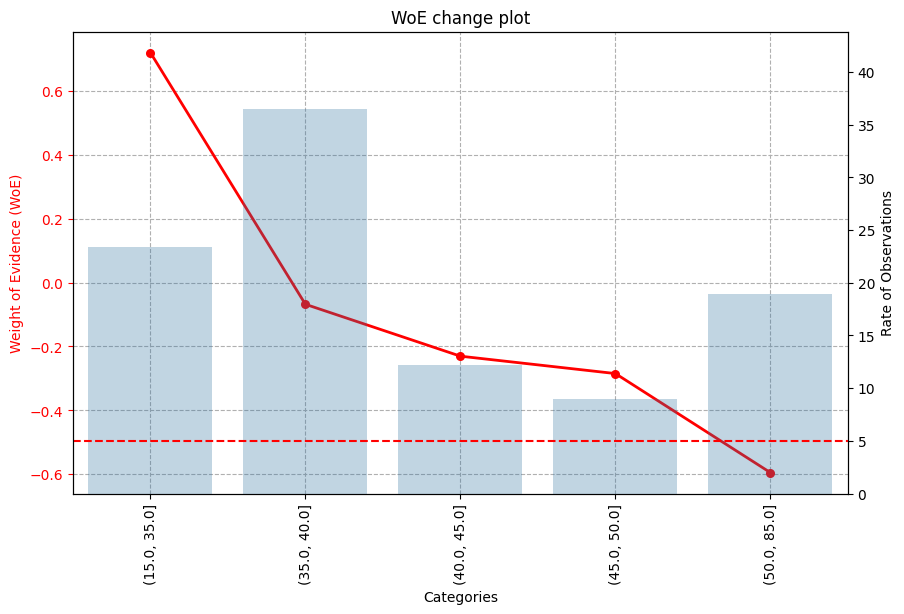

In [ ]:
bins = [15, 35.0,40.0, 45.0, 50.0, 85.0]
train_df['age_cat'] = pd.cut(train_df['age'], bins=bins)
test_df['age_cat'] = pd.cut(test_df['age'], bins=bins)

woe_df = get_WoE(train_df, 'age_cat', 'smoking', sort=False)
view_WoE(woe_df, 'age_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('age_cat')['rank'].to_dict()
train_df['age_rank'] = train_df['age_cat'].map(rank_dict)
test_df['age_rank'] = test_df['age_cat'].map(rank_dict)
train_df['age_rank'] = pd.to_numeric(train_df['age_rank'], errors='coerce')
test_df['age_rank'] = pd.to_numeric(test_df['age_rank'], errors='coerce')

train_df.drop(columns=['age_cat'], axis=1, inplace=True)
test_df.drop(columns=['age_cat'], axis=1, inplace=True)

In [ ]:
show_plot(train_df, test_df, 'age_rank')

#### height(cm):

   - Height in centimeters.
   - **Mean:** 164.67 cm, **Range:** 140 to 190 cm.
   - Most heights fall within a typical adult range, with a few shorter and taller outliers.

In [ ]:
show_plot(train_df, test_df, 'height(cm)')

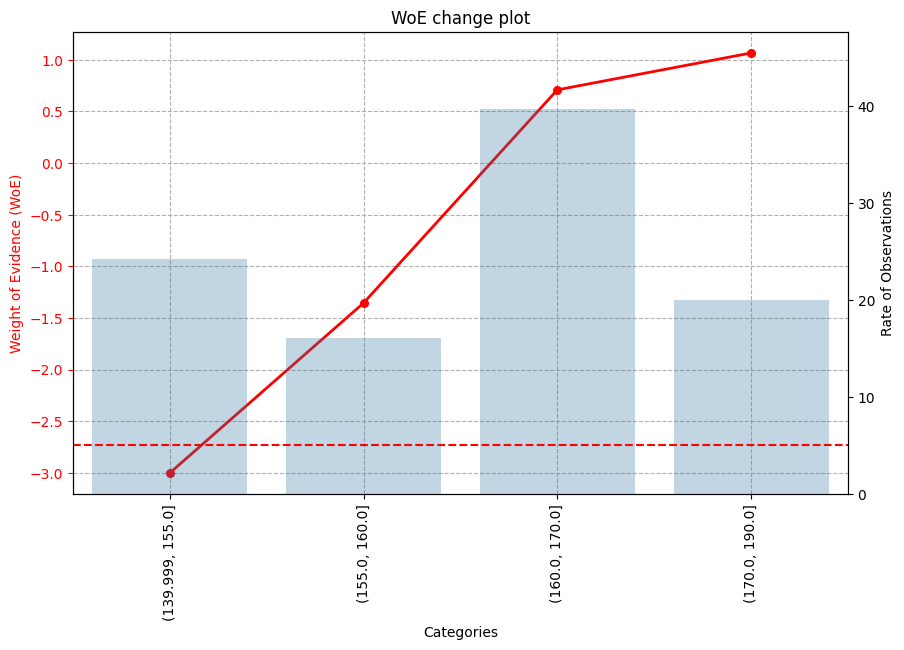

In [ ]:
train_df['height_cat'] = pd.qcut(train_df['height(cm)'], q=5, duplicates='drop')
test_df['height_cat'] = pd.qcut(test_df['height(cm)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'height_cat', 'smoking', sort=False)
view_WoE(woe_df, 'height_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('height_cat')['rank'].to_dict()
train_df['height_rank'] = train_df['height_cat'].map(rank_dict)
test_df['height_rank'] = test_df['height_cat'].map(rank_dict)
train_df['height_rank'] = pd.to_numeric(train_df['height_rank'], errors='coerce')
test_df['height_rank'] = pd.to_numeric(test_df['height_rank'], errors='coerce')

train_df.drop(columns=['height_cat'], axis=1, inplace=True)
test_df.drop(columns=['height_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'height_rank')

#### weight(kg)

   - Weight in kilograms.
   - **Mean:** 64.24 kg, **Range:** 40 to 120 kg.
   - Weight distribution seems typical, but some higher values might be linked to obesity.

In [ ]:
show_plot(train_df, test_df, 'weight(kg)')

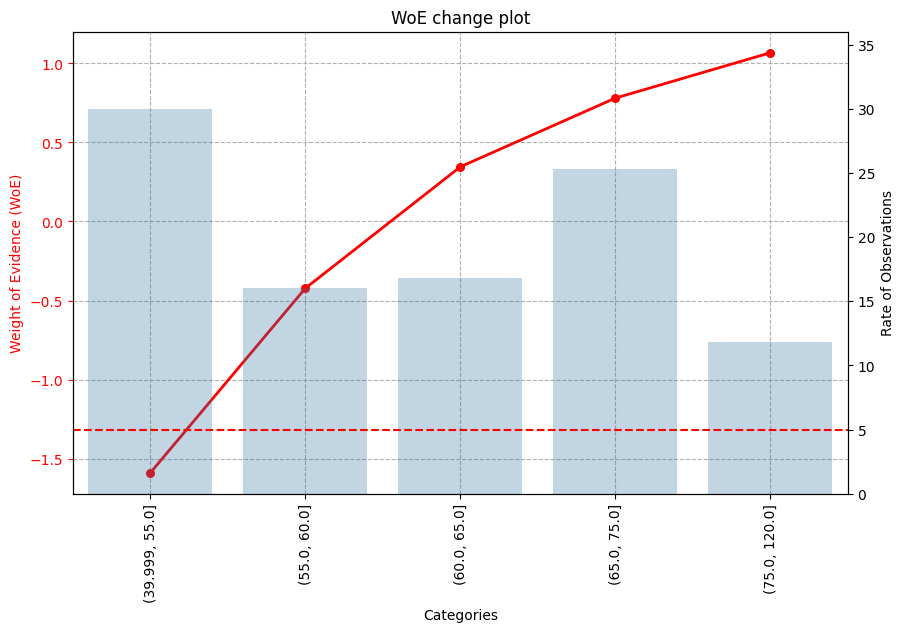

In [ ]:
train_df['weight_cat'] = pd.qcut(train_df['weight(kg)'], q=5, duplicates='drop')
test_df['weight_cat'] = pd.qcut(test_df['weight(kg)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'weight_cat', 'smoking', sort=False)
view_WoE(woe_df, 'weight_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('weight_cat')['rank'].to_dict()
train_df['weight_rank'] = train_df['weight_cat'].map(rank_dict)
test_df['weight_rank'] = test_df['weight_cat'].map(rank_dict)
train_df['weight_rank'] = pd.to_numeric(train_df['weight_rank'], errors='coerce')
test_df['weight_rank'] = pd.to_numeric(test_df['weight_rank'], errors='coerce')

train_df.drop(columns=['weight_cat'], axis=1, inplace=True)
test_df.drop(columns=['weight_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'weight_rank')

#### waist(cm)

   - Waist circumference in centimeters.
   - **Mean:** 80.25 cm, **Range:** 1 to 117 cm.
   - Note that a waist of 1 cm is likely an error, as it's an implausibly low value.

In [ ]:
show_plot(train_df, test_df, 'waist(cm)')

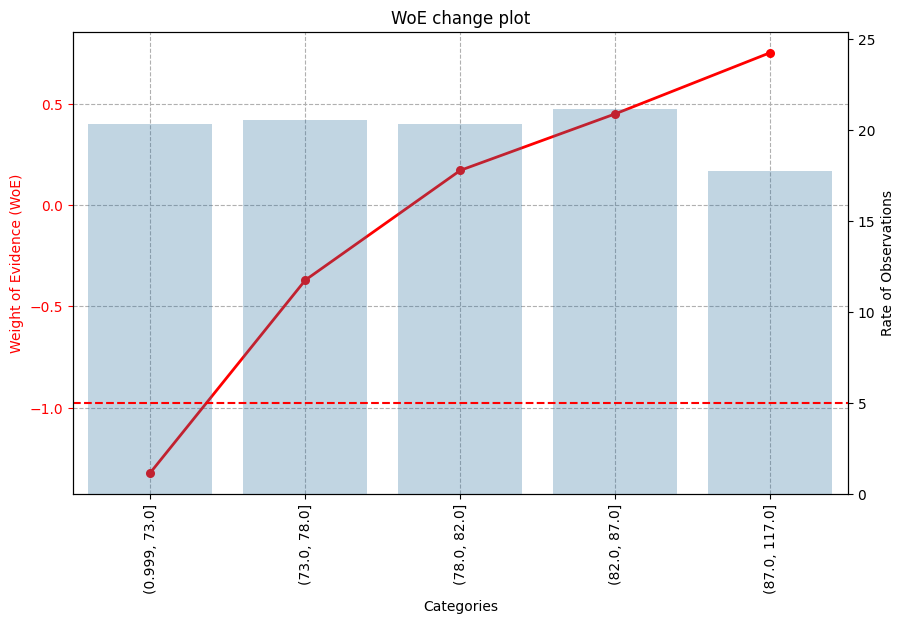

In [ ]:
train_df['waist_cat'] = pd.qcut(train_df['waist(cm)'], q=5, duplicates='drop')
test_df['waist_cat'] = pd.qcut(test_df['waist(cm)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'waist_cat', 'smoking', sort=False)
view_WoE(woe_df, 'waist_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('waist_cat')['rank'].to_dict()
train_df['waist_rank'] = train_df['waist_cat'].map(rank_dict)
test_df['waist_rank'] = test_df['waist_cat'].map(rank_dict)
train_df['waist_rank'] = pd.to_numeric(train_df['waist_rank'], errors='coerce')
test_df['waist_rank'] = pd.to_numeric(test_df['waist_rank'], errors='coerce')

train_df.drop(columns=['waist_cat'], axis=1, inplace=True)
test_df.drop(columns=['waist_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'waist_rank')

#### eyesight(left)

   - Vision quality of the left eye (likely a measure of visual acuity).
   - **Mean:** 1.03, with values ranging from 0.1 to 9.9.
   - Higher values might represent better vision, though some unusually high values might indicate data inconsistencies.

In [ ]:
show_plot(train_df, test_df, 'eyesight(left)')

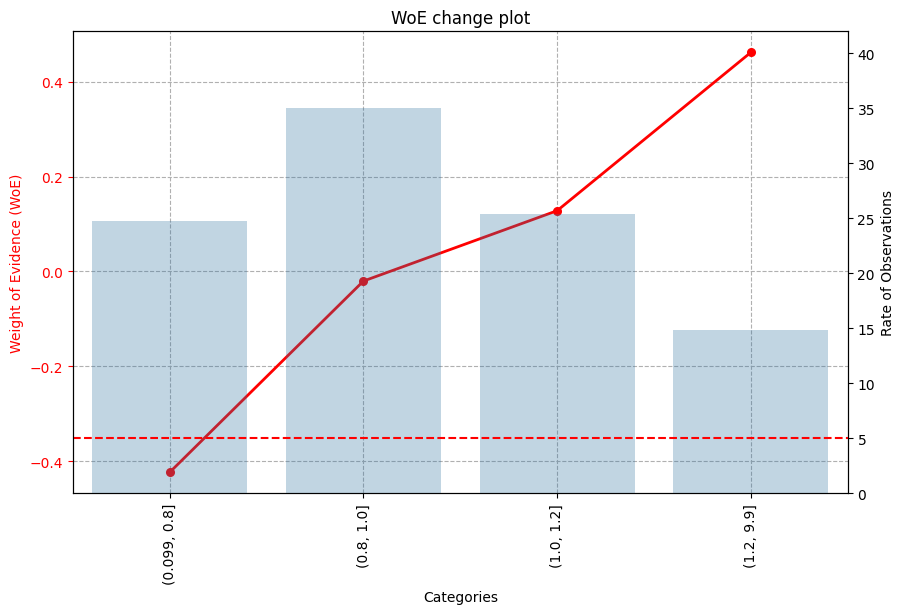

In [ ]:
train_df['eyesight(left)_cat'] = pd.qcut(train_df['eyesight(left)'], q=5, duplicates='drop')
test_df['eyesight(left)_cat'] = pd.qcut(test_df['eyesight(left)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'eyesight(left)_cat', 'smoking', sort=False)
view_WoE(woe_df, 'eyesight(left)_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('eyesight(left)_cat')['rank'].to_dict()
train_df['eyesight(left)_rank'] = train_df['eyesight(left)_cat'].map(rank_dict)
test_df['eyesight(left)_rank'] = test_df['eyesight(left)_cat'].map(rank_dict)

train_df.drop(columns=['eyesight(left)_cat'], axis=1, inplace=True)
test_df.drop(columns=['eyesight(left)_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'eyesight(left)_rank')

#### eyesight(right)

   - Vision quality of the right eye.
   - **Mean:** 1.03, **Range:** 0.1 to 9.9.
   - Similar distribution and trends to the left eyesight column.

In [ ]:
show_plot(train_df, test_df, 'eyesight(right)')

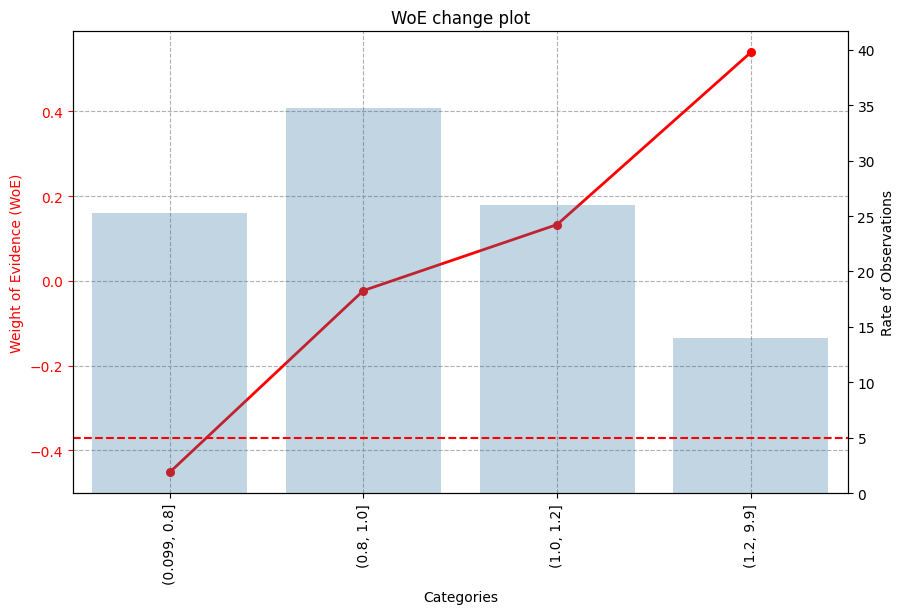

In [ ]:
train_df['eyesight(right)_cat'] = pd.qcut(train_df['eyesight(right)'], q=5, duplicates='drop')
test_df['eyesight(right)_cat'] = pd.qcut(test_df['eyesight(right)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'eyesight(right)_cat', 'smoking', sort=False)
view_WoE(woe_df, 'eyesight(right)_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('eyesight(right)_cat')['rank'].to_dict()
train_df['eyesight(right)_rank'] = train_df['eyesight(right)_cat'].map(rank_dict)
test_df['eyesight(right)_rank'] = test_df['eyesight(right)_cat'].map(rank_dict)

train_df.drop(columns=['eyesight(right)_cat'], axis=1, inplace=True)
test_df.drop(columns=['eyesight(right)_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'eyesight(right)_rank')

#### hearing(left)

   - Hearing ability in the left ear (probably a binary indicator where 1 is normal and 2 indicates hearing issues).
   - **Range:** 1 to 2, with a mean near 1.
   - Most values are at 1, suggesting normal hearing for the majority.

In [ ]:
show_plot(train_df, test_df, 'hearing(left)')

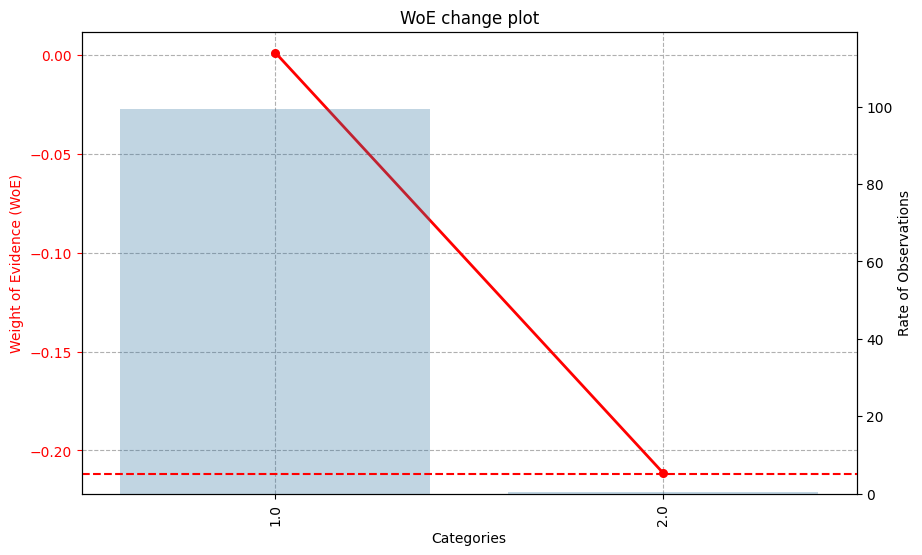

In [ ]:
train_df['hearing_left_cat']  = pd.qcut(train_df['hearing(left)'], q=5, duplicates='drop')
test_df['hearing_left_cat']  = pd.qcut(test_df['hearing(left)'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'hearing(left)', 'smoking', sort=False)
view_WoE(woe_df, 'hearing(left)', plotly=False)

#### hearing(right)

   - Hearing ability in the right ear.
   - **Range:** 1 to 2, with a mean of 1.0.
   - Same trend as hearing(left), with most values at 1, indicating normal hearing.


In [ ]:
show_plot(train_df, test_df, 'hearing(right)')

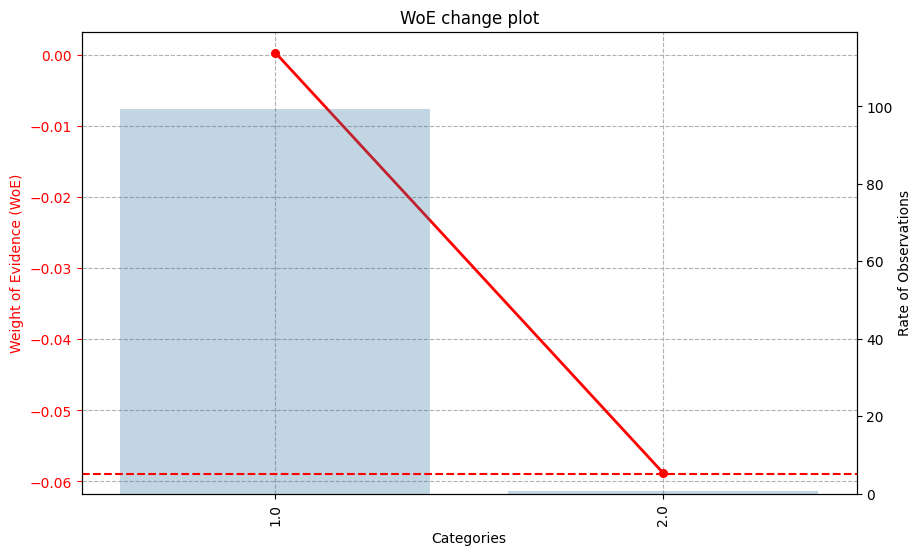

In [ ]:
woe_df = get_WoE(train_df, 'hearing(right)', 'smoking', sort=False)
view_WoE(woe_df, 'hearing(right)', plotly=False)

#### systolic

   - Systolic blood pressure, the higher number in a blood pressure reading.
   - **Mean:** 119.2, **Range:** 84 to 199.
   - Values above 120 might suggest borderline or high blood pressure in certain individuals.

In [ ]:
show_plot(train_df, test_df, 'systolic')

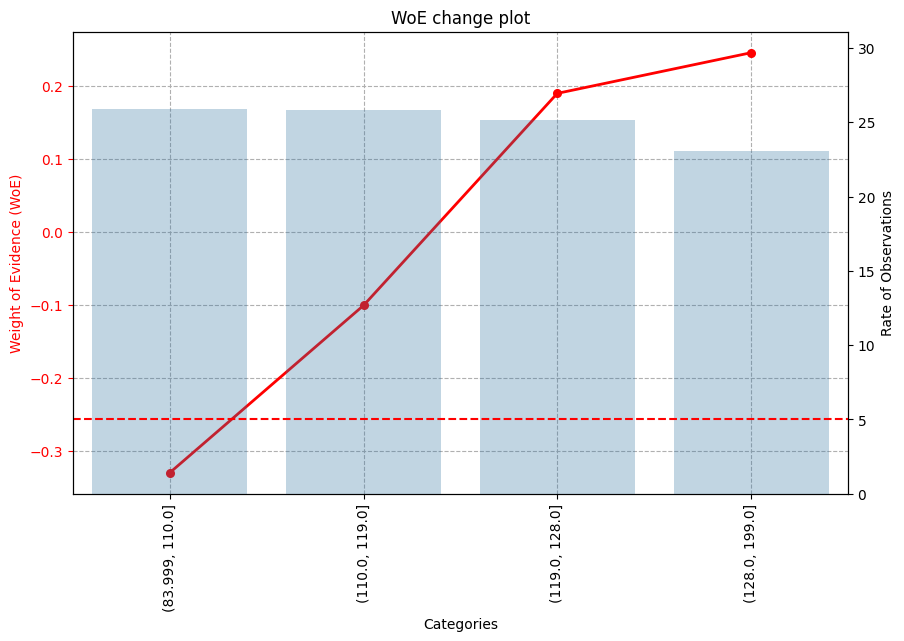

In [ ]:
train_df['systolic_cat'] = pd.qcut(train_df['systolic'], q=4, duplicates='drop')
test_df['systolic_cat'] = pd.qcut(test_df['systolic'], q=4, duplicates='drop')

woe_df = get_WoE(train_df, 'systolic_cat', 'smoking', sort=False)
view_WoE(woe_df, 'systolic_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('systolic_cat')['rank'].to_dict()
train_df['systolic_rank'] = train_df['systolic_cat'].map(rank_dict)
test_df['systolic_rank'] = test_df['systolic_cat'].map(rank_dict)

train_df.drop(columns=['systolic_cat'], axis=1, inplace=True)
test_df.drop(columns=['systolic_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'systolic_rank')

#### relaxation

   - Diastolic blood pressure, the lower number in a blood pressure reading.
   - **Mean:** 79.97, **Range:** 49 to 142.
   - Values above 80 could indicate elevated diastolic pressure.

In [ ]:
show_plot(train_df, test_df, 'relaxation')

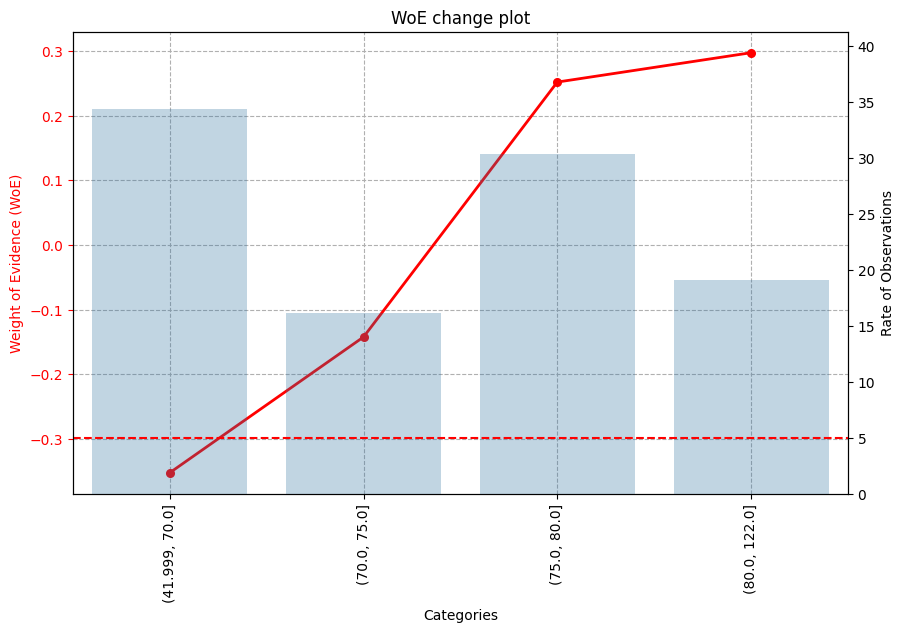

In [ ]:
train_df['relaxation_cat'] = pd.qcut(train_df['relaxation'], q=4, duplicates='drop')
test_df['relaxation_cat'] = pd.qcut(test_df['relaxation'], q=4, duplicates='drop')

woe_df = get_WoE(train_df, 'relaxation_cat', 'smoking', sort=False)
view_WoE(woe_df, 'relaxation_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('relaxation_cat')['rank'].to_dict()
train_df['relaxation_rank'] = train_df['relaxation_cat'].map(rank_dict)
test_df['relaxation_rank'] = test_df['relaxation_cat'].map(rank_dict)

train_df.drop(columns=['relaxation_cat'], axis=1, inplace=True)
test_df.drop(columns=['relaxation_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'relaxation_rank')

#### fasting blood sugar

   - Blood glucose level after fasting.
   - **Mean:** 98.96, **Range:** 60 to 500.
   - Some high values (close to 500) may represent individuals with unmanaged diabetes.

In [ ]:
show_plot(train_df, test_df, 'fasting blood sugar')

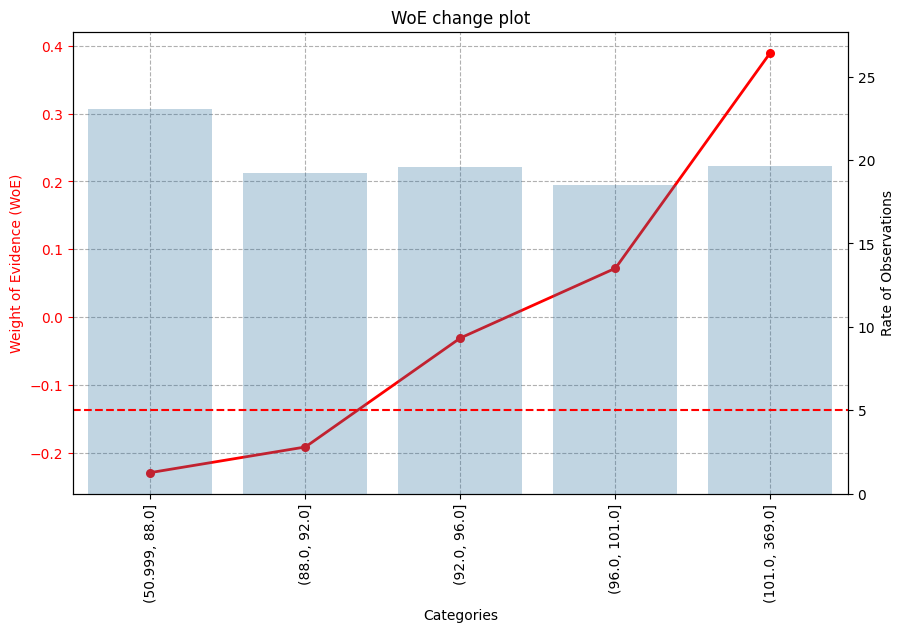

In [ ]:
train_df['fasting blood sugar_cat'] = pd.qcut(train_df['fasting blood sugar'], q=5, duplicates='drop')
test_df['fasting blood sugar_cat'] = pd.qcut(test_df['fasting blood sugar'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'fasting blood sugar_cat', 'smoking', sort=False)
view_WoE(woe_df, 'fasting blood sugar_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('fasting blood sugar_cat')['rank'].to_dict()
train_df['fasting blood sugar_rank'] = train_df['fasting blood sugar_cat'].map(rank_dict)
test_df['fasting blood sugar_rank'] = test_df['fasting blood sugar_cat'].map(rank_dict)

train_df.drop(columns=['fasting blood sugar_cat'], axis=1, inplace=True)
test_df.drop(columns=['fasting blood sugar_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'fasting blood sugar_rank')

#### Cholesterol

   - Total cholesterol level.
   - **Mean:** 187.74, **Range:** 54 to 503.
   - Typical healthy cholesterol levels range below 200, so higher values may indicate hypercholesterolemia.

In [ ]:
show_plot(train_df, test_df, 'Cholesterol')

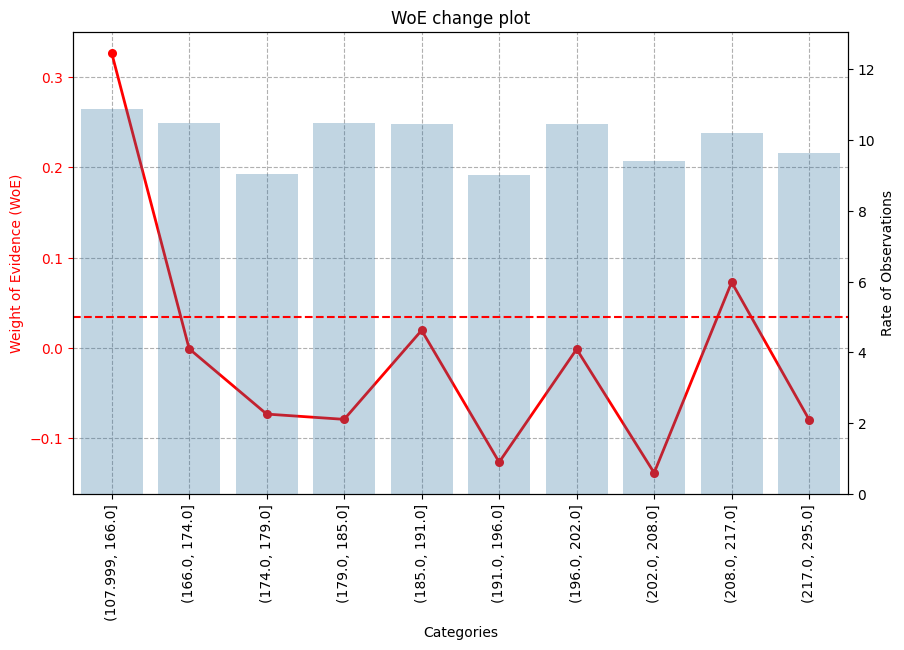

In [ ]:
train_df['Cholesterol_cat'] = pd.qcut(train_df['Cholesterol'], q=10, duplicates='drop')
test_df['Cholesterol_cat'] = pd.qcut(test_df['Cholesterol'], q=10, duplicates='drop')

woe_df = get_WoE(train_df, 'Cholesterol_cat', 'smoking', sort=False)
view_WoE(woe_df, 'Cholesterol_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('Cholesterol_cat')['rank'].to_dict()
train_df['Cholesterol_rank'] = train_df['Cholesterol_cat'].map(rank_dict)
test_df['Cholesterol_rank'] = test_df['Cholesterol_cat'].map(rank_dict)

train_df.drop(columns=['Cholesterol_cat'], axis=1, inplace=True)
test_df.drop(columns=['Cholesterol_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'Cholesterol_rank')

#### triglyceride

   - Triglyceride level, associated with metabolic health.
   - **Mean:** 137.26, **Range:** 15 to 3616.
   - Some extremely high values could represent metabolic syndrome or data entry errors.

In [ ]:
show_plot(train_df, test_df, 'triglyceride')

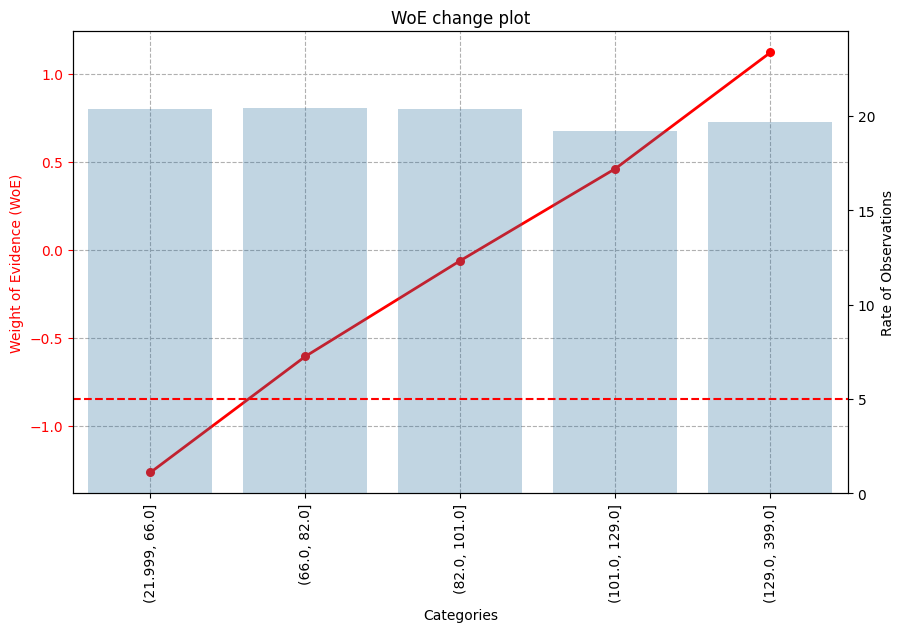

In [ ]:
train_df['triglyceride_cat'] = pd.qcut(train_df['triglyceride'], q=5, duplicates='drop')
test_df['triglyceride_cat'] = pd.qcut(test_df['triglyceride'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'triglyceride_cat', 'smoking', sort=False)
view_WoE(woe_df, 'triglyceride_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('triglyceride_cat')['rank'].to_dict()
train_df['triglyceride_rank'] = train_df['triglyceride_cat'].map(rank_dict)
test_df['triglyceride_rank'] = test_df['triglyceride_cat'].map(rank_dict)

train_df.drop(columns=['triglyceride_cat'], axis=1, inplace=True)
test_df.drop(columns=['triglyceride_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'triglyceride_rank')

#### HDL (High-Density Lipoprotein)

   - Known as "good" cholesterol.
   - **Mean:** 57.37, **Range:** 28 to 107.
   - Generally, higher values are favorable for cardiovascular health.


In [ ]:
show_plot(train_df, test_df, 'HDL')

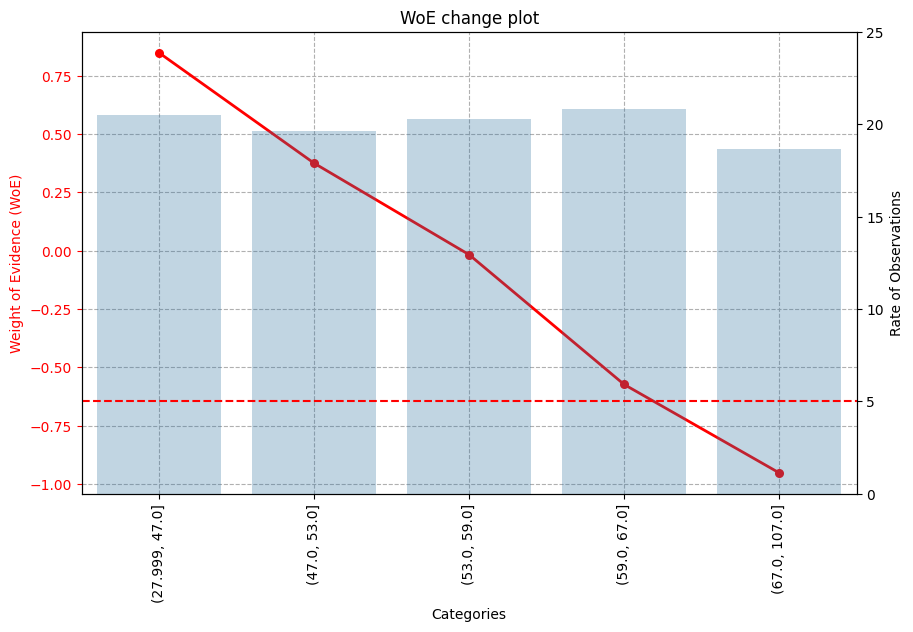

In [ ]:
train_df['HDL_cat'] = pd.qcut(train_df['HDL'], q=5, duplicates='drop')
test_df['HDL_cat'] = pd.qcut(test_df['HDL'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'HDL_cat', 'smoking', sort=False)
view_WoE(woe_df, 'HDL_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('HDL_cat')['rank'].to_dict()
train_df['HDL_rank'] = train_df['HDL_cat'].map(rank_dict)
test_df['HDL_rank'] = test_df['HDL_cat'].map(rank_dict)

train_df.drop(columns=['HDL_cat'], axis=1, inplace=True)
test_df.drop(columns=['HDL_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'HDL_rank')

#### LDL (Low-Density Lipoprotein)

   - Known as "bad" cholesterol.
   - **Mean:** 113.39, **Range:** 47 to 202.
   - High values suggest increased risk for cardiovascular issues.

In [ ]:
show_plot(train_df, test_df, 'LDL')

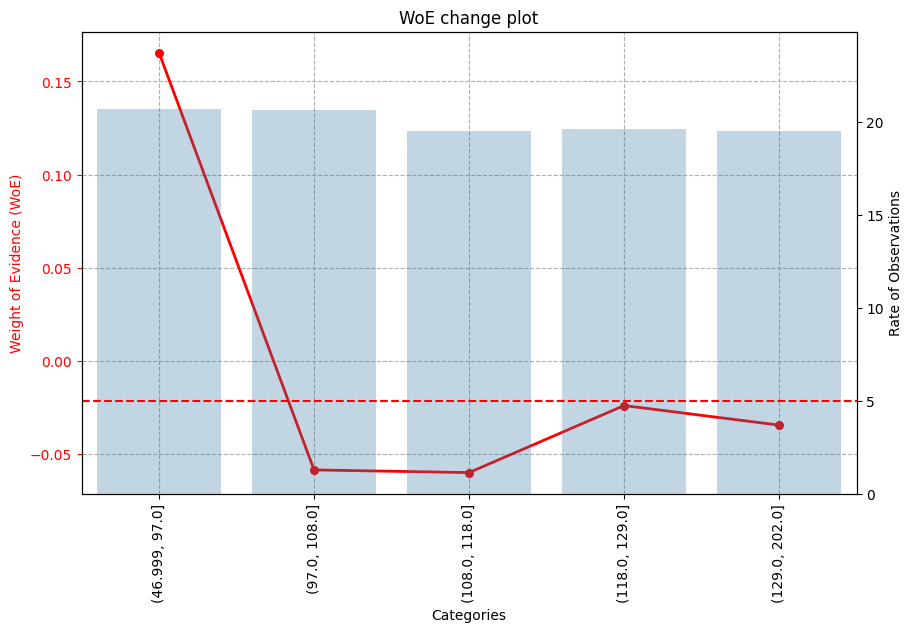

In [ ]:
train_df['LDL_cat'] = pd.qcut(train_df['LDL'], q=5, duplicates='drop')
test_df['LDL_cat'] = pd.qcut(test_df['LDL'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'LDL_cat', 'smoking', sort=False)
view_WoE(woe_df, 'LDL_cat', plotly=False)

#### hemoglobin

   - Hemoglobin level in blood, reflecting oxygen-carrying capacity.
   - **Mean:** 14.51, **Range:** 7.3 to 18.8.
   - Low values may suggest anemia, while high values might indicate polycythemia.

In [ ]:
show_plot(train_df, test_df, 'hemoglobin')

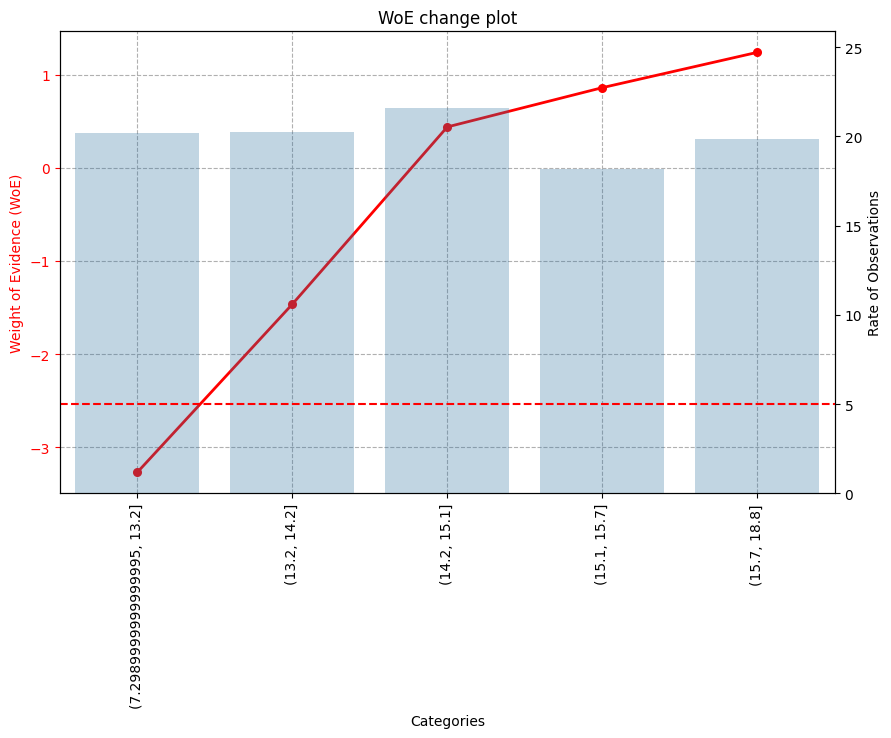

In [ ]:
train_df['hemoglobin_cat'] = pd.qcut(train_df['hemoglobin'], q=5, duplicates='drop')
test_df['hemoglobin_cat'] = pd.qcut(test_df['hemoglobin'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'hemoglobin_cat', 'smoking', sort=False)
view_WoE(woe_df, 'hemoglobin_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('hemoglobin_cat')['rank'].to_dict()
train_df['hemoglobin_rank'] = train_df['hemoglobin_cat'].map(rank_dict)
test_df['hemoglobin_rank'] = test_df['hemoglobin_cat'].map(rank_dict)

train_df.drop(columns=['hemoglobin_cat'], axis=1, inplace=True)
test_df.drop(columns=['hemoglobin_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'hemoglobin_rank')

#### Urine protein

   - Protein levels in urine, often an indicator of kidney health.
   - **Mean:** 1.01, **Range:** 1 to 5.
   - Higher values might indicate proteinuria, possibly due to kidney issues.

In [ ]:
show_plot(train_df, test_df, 'Urine protein')

#### serum creatinine

   - Indicator of kidney function.
   - **Mean:** 0.87, **Range:** 0.1 to 1.5.
   - Higher values can indicate compromised kidney function.

In [ ]:
show_plot(train_df, test_df, 'serum creatinine')

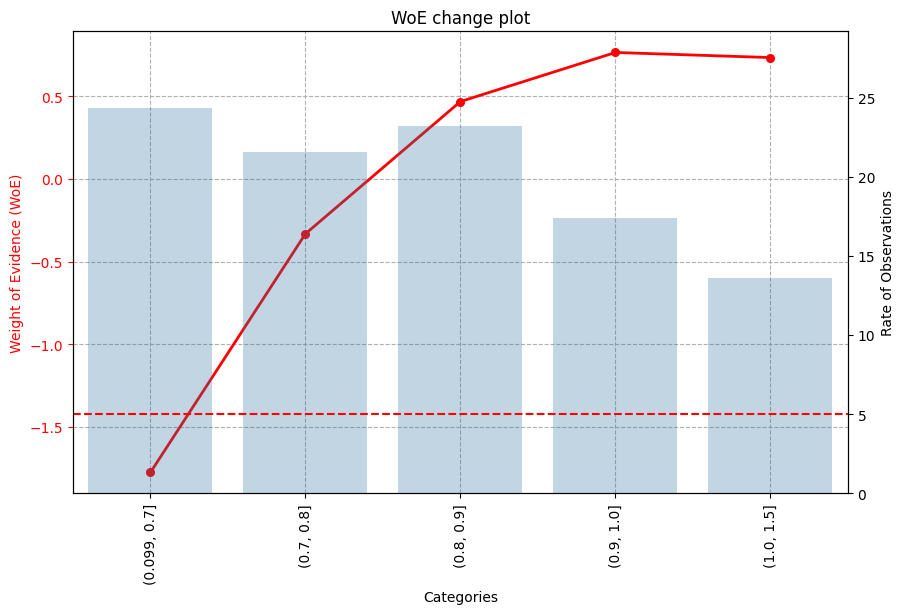

In [ ]:
train_df['serum creatinine_cat'] = pd.qcut(train_df['serum creatinine'], q=5, duplicates='drop')
test_df['serum creatinine_cat'] = pd.qcut(test_df['serum creatinine'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'serum creatinine_cat', 'smoking', sort=False)
view_WoE(woe_df, 'serum creatinine_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('serum creatinine_cat')['rank'].to_dict()

train_df['serum creatinine_rank'] = train_df['serum creatinine_cat'].map(rank_dict)
test_df['serum creatinine_rank'] = test_df['serum creatinine_cat'].map(rank_dict)

train_df.drop(columns=['serum creatinine_cat'], axis=1, inplace=True)
test_df.drop(columns=['serum creatinine_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'serum creatinine_rank')

#### AST (Aspartate Aminotransferase)

   - Enzyme level related to liver health.
   - **Mean:** 22.24, **Range:** 10 to 87.
   - High levels could indicate liver disease.

In [ ]:
show_plot(train_df, test_df, 'AST')

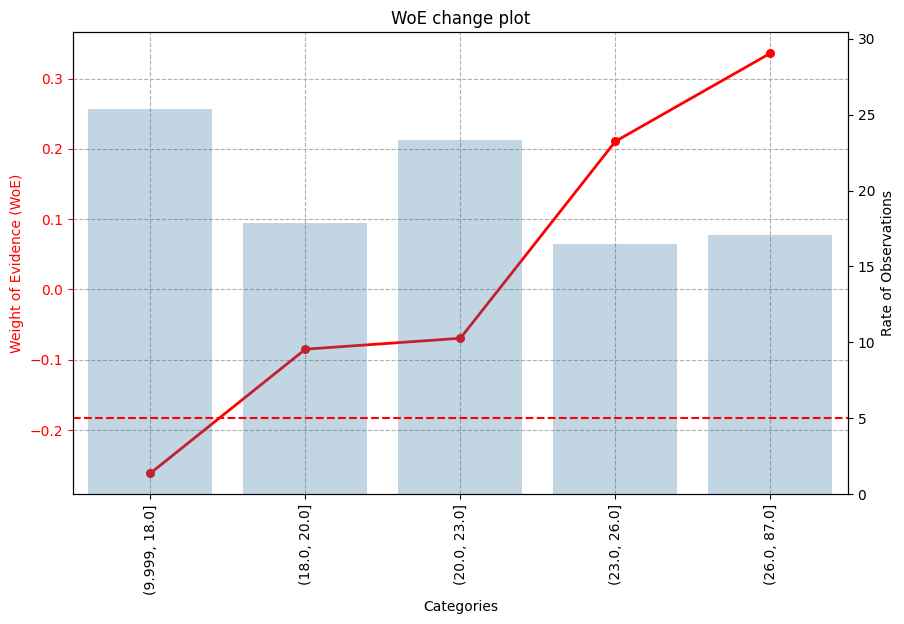

In [ ]:
train_df['AST_cat'] = pd.qcut(train_df['AST'], q=5, duplicates='drop')
test_df['AST_cat'] = pd.qcut(test_df['AST'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'AST_cat', 'smoking', sort=False)
view_WoE(woe_df, 'AST_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('AST_cat')['rank'].to_dict()

train_df['AST_rank'] = train_df['AST_cat'].map(rank_dict)
test_df['AST_rank'] = test_df['AST_cat'].map(rank_dict)

train_df.drop(columns=['AST_cat'], axis=1, inplace=True)
test_df.drop(columns=['AST_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'AST_rank')

#### ALT (Alanine Aminotransferase)

   - Enzyme level reflecting liver health.
   - **Mean:** 20.86, **Range:** 5 to 166.
   - Elevated levels often signal liver inflammation or damage.

In [ ]:
show_plot(train_df, test_df, 'ALT')

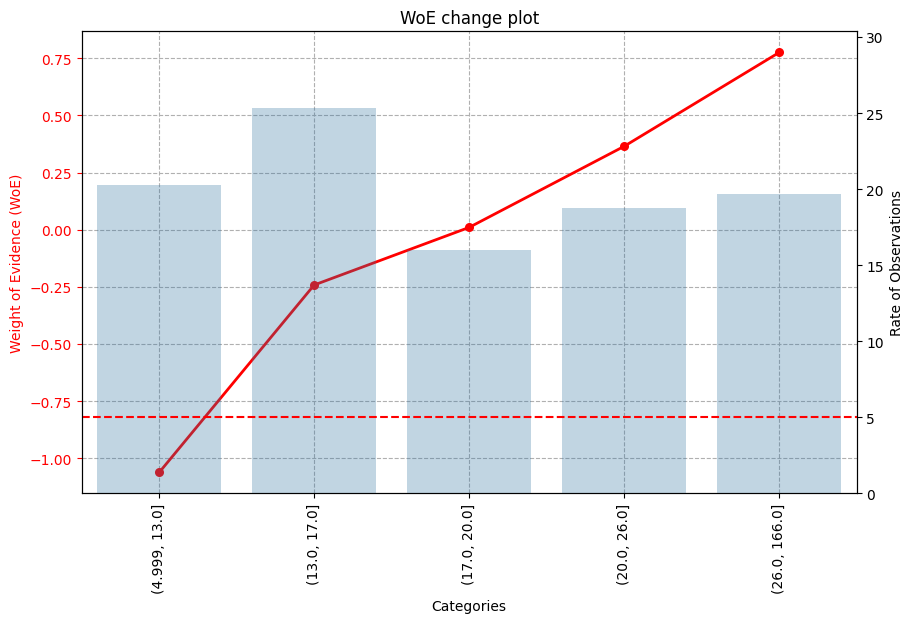

In [ ]:
train_df['ALT_cat'] = pd.qcut(train_df['ALT'], q=5, duplicates='drop')
test_df['ALT_cat'] = pd.qcut(test_df['ALT'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'ALT_cat', 'smoking', sort=False)
view_WoE(woe_df, 'ALT_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('ALT_cat')['rank'].to_dict()

train_df['ALT_rank'] = train_df['ALT_cat'].map(rank_dict)
test_df['ALT_rank'] = test_df['ALT_cat'].map(rank_dict)

train_df.drop(columns=['ALT_cat'], axis=1, inplace=True)
test_df.drop(columns=['ALT_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'ALT_rank')

#### Gtp (Gamma-glutamyl transferase)

   - Enzyme related to liver health.
   - **Mean:** 26.29, **Range:** 6 to 439.
   - High values might indicate liver stress, commonly due to alcohol consumption or liver disease.


In [ ]:
show_plot(train_df, test_df, 'Gtp')

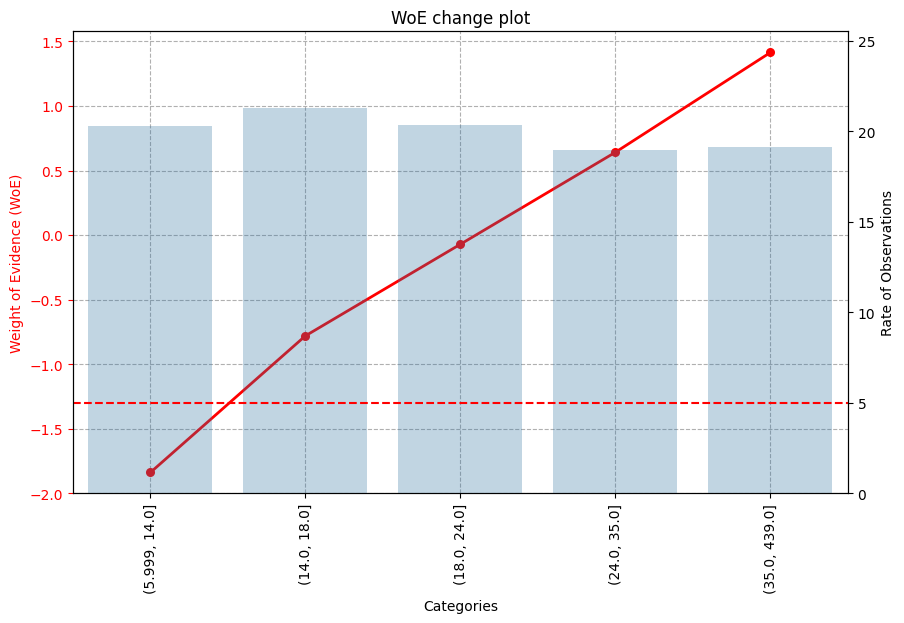

In [ ]:
train_df['Gtp_cat'] = pd.qcut(train_df['Gtp'], q=5, duplicates='drop')
test_df['Gtp_cat'] = pd.qcut(test_df['Gtp'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'Gtp_cat', 'smoking', sort=False)
view_WoE(woe_df, 'Gtp_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('Gtp_cat')['rank'].to_dict()
train_df['Gtp_rank'] = train_df['Gtp_cat'].map(rank_dict)
test_df['Gtp_rank'] = test_df['Gtp_cat'].map(rank_dict)

train_df.drop(columns=['Gtp_cat'], axis=1, inplace=True)
test_df.drop(columns=['Gtp_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'Gtp_rank')

#### dental caries

   - Indicates presence of dental cavities (likely binary, where 0 means no cavities, and 1 means cavities).
   - **Mean:** 0.145, **Range:** 0 to 1.
   - Most individuals have a value of 0, suggesting no cavities for the majority.


In [ ]:
show_plot(train_df, test_df, 'dental caries')

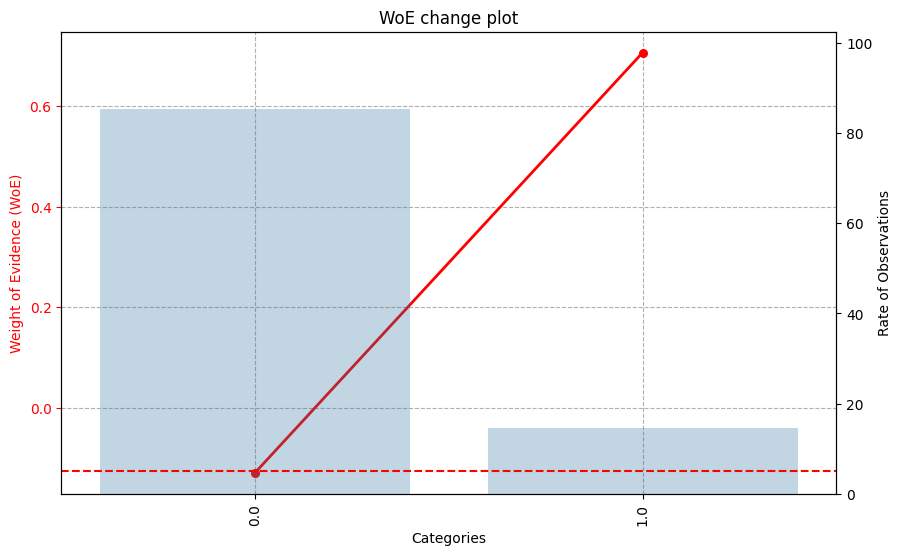

In [ ]:
woe_df = get_WoE(train_df, 'dental caries', 'smoking', sort=False)
view_WoE(woe_df, 'dental caries', plotly=False)

### New columns

##### BMI

In [ ]:
train_df['BMI'] = train_df['weight(kg)'] / ((train_df['height(cm)'] / 100) ** 2)
test_df['BMI'] = test_df['weight(kg)'] / ((test_df['height(cm)'] / 100) ** 2)

In [ ]:
show_plot(train_df, test_df, 'BMI')

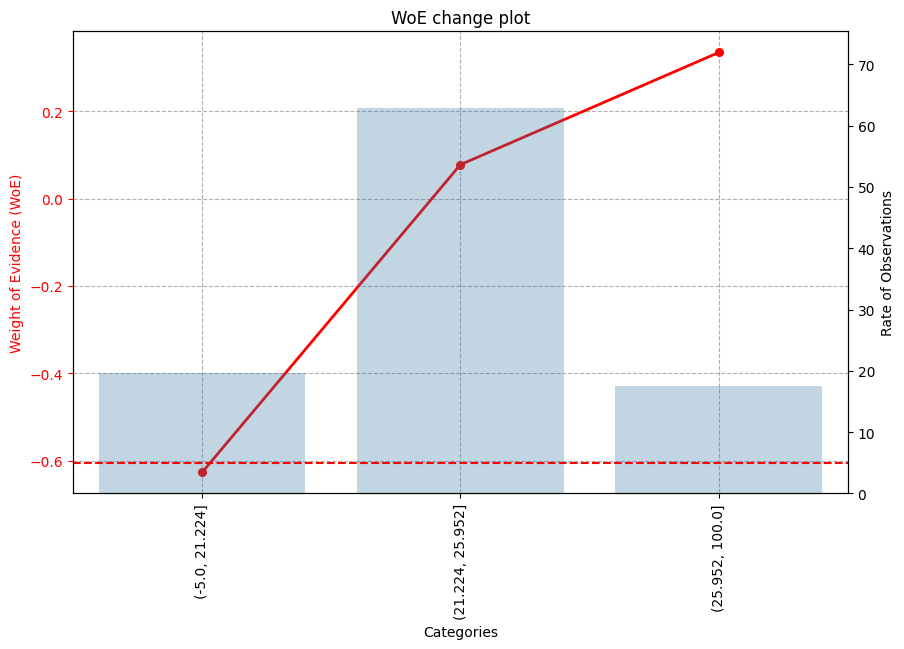

In [ ]:
bins = [-5.0, 21.224, 25.952, 100.0]
train_df['BMI_cat'] = pd.cut(train_df['BMI'], bins=bins, duplicates='drop')
test_df['BMI_cat'] = pd.cut(test_df['BMI'], bins=bins, duplicates='drop')

woe_df = get_WoE(train_df, 'BMI_cat', 'smoking', sort=False)
view_WoE(woe_df, 'BMI_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('BMI_cat')['rank'].to_dict()
train_df['BMI_rank'] = train_df['BMI_cat'].map(rank_dict)
test_df['BMI_rank'] = test_df['BMI_cat'].map(rank_dict)

train_df.drop(columns=['BMI_cat'], axis=1, inplace=True)
test_df.drop(columns=['BMI_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'BMI_rank')

#### waist_height_ratio

In [ ]:
train_df['waist_height_ratio'] = train_df['waist(cm)'] / train_df['height(cm)']
test_df['waist_height_ratio'] = test_df['waist(cm)'] / test_df['height(cm)']

show_plot(train_df, test_df, 'waist_height_ratio')

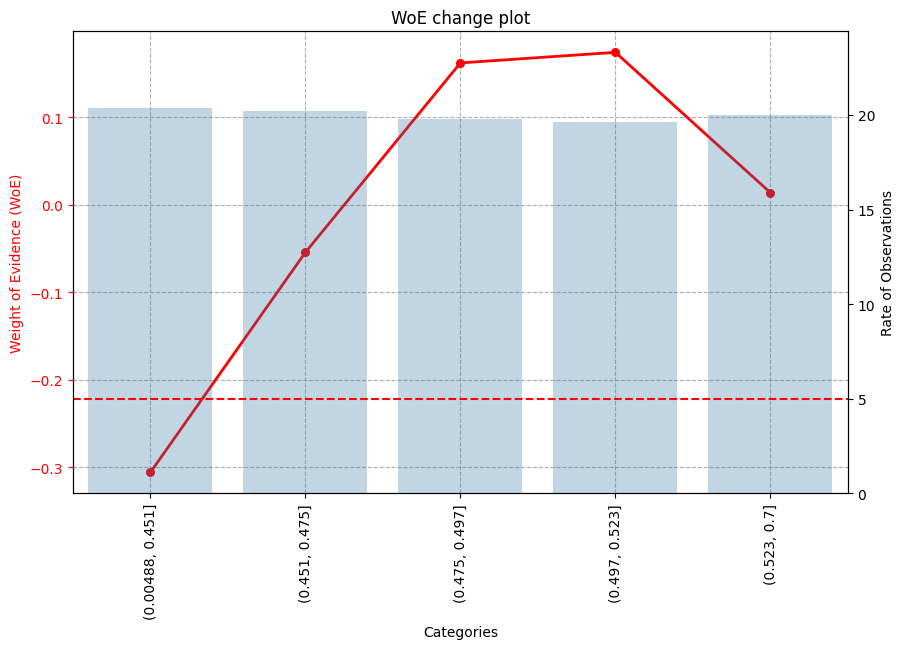

In [ ]:
train_df['waist_height_ratio_cat'] = pd.qcut(train_df['waist_height_ratio'], q=5, duplicates='drop')
test_df['waist_height_ratio_cat'] = pd.qcut(test_df['waist_height_ratio'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'waist_height_ratio_cat', 'smoking', sort=False)
view_WoE(woe_df, 'waist_height_ratio_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('waist_height_ratio_cat')['rank'].to_dict()

train_df['waist_height_ratio_rank'] = train_df['waist_height_ratio_cat'].map(rank_dict)
test_df['waist_height_ratio_rank'] = test_df['waist_height_ratio_cat'].map(rank_dict)

train_df.drop(columns=['waist_height_ratio_cat'], axis=1, inplace=True)
test_df.drop(columns=['waist_height_ratio_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'waist_height_ratio_rank')

#### avg_eyesight

In [ ]:
train_df['avg_eyesight'] = (train_df['eyesight(left)'] + train_df['eyesight(right)']) / 2
test_df['avg_eyesight'] = (test_df['eyesight(left)'] + test_df['eyesight(right)']) / 2

show_plot(train_df, test_df, 'avg_eyesight')

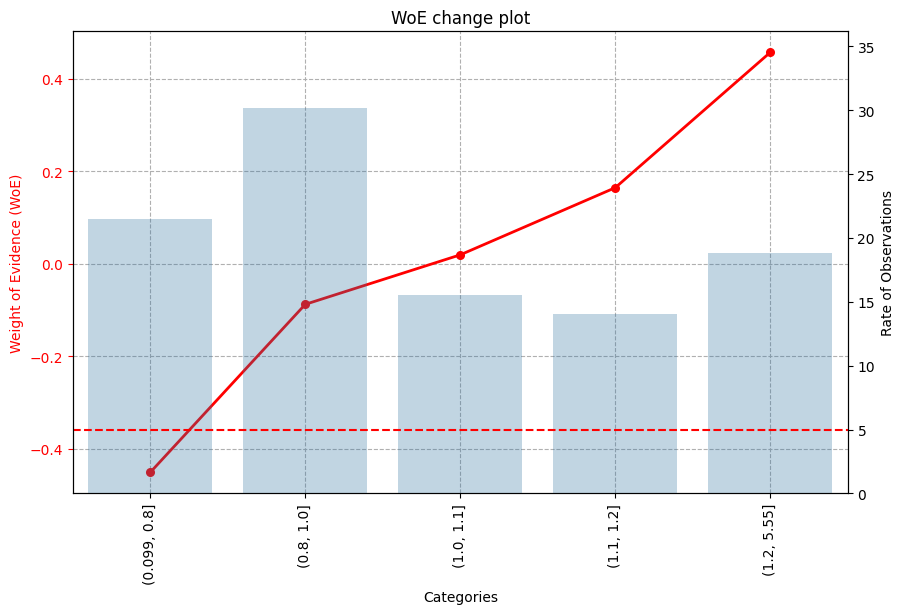

In [ ]:
train_df['avg_eyesight_cat'] = pd.qcut(train_df['avg_eyesight'], q=5, duplicates='drop')
test_df['avg_eyesight_cat'] = pd.qcut(test_df['avg_eyesight'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'avg_eyesight_cat', 'smoking', sort=False)
view_WoE(woe_df, 'avg_eyesight_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('avg_eyesight_cat')['rank'].to_dict()
train_df['avg_eyesight_rank'] = train_df['avg_eyesight_cat'].map(rank_dict)
test_df['avg_eyesight_rank'] = test_df['avg_eyesight_cat'].map(rank_dict)

train_df.drop(columns=['avg_eyesight_cat'], axis=1, inplace=True)
test_df.drop(columns=['avg_eyesight_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'avg_eyesight_rank')

#### avg_hearing

In [ ]:
train_df['avg_hearing' ] = (train_df['hearing(left)'] + train_df['hearing(right)']) / 2
test_df['avg_hearing'] = (test_df['hearing(left)'] + test_df['hearing(right)']) / 2

show_plot(train_df, test_df, 'avg_hearing')

#### blood_pressure_category

In [ ]:
train_df['blood_pressure_category'] = pd.cut(train_df['systolic'], bins=[0, 120, 140, np.inf], labels=[0, 1, 2])
test_df['blood_pressure_category'] = pd.cut(test_df['systolic'], bins=[0, 120, 140, np.inf], labels=[0, 1, 2])

show_plot(train_df, test_df, 'blood_pressure_category')

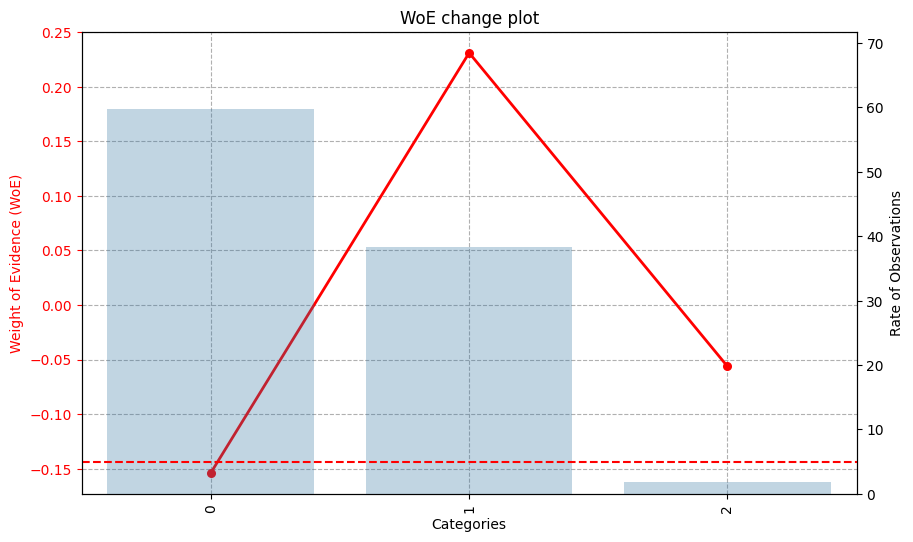

In [ ]:
woe_df = get_WoE(train_df, 'blood_pressure_category', 'smoking', sort=True)
view_WoE(woe_df, 'blood_pressure_category', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('blood_pressure_category')['rank'].to_dict()
train_df['blood_pressure_category_rank'] = train_df['blood_pressure_category'].map(rank_dict)
test_df['blood_pressure_category_rank'] = test_df['blood_pressure_category'].map(rank_dict)

train_df.drop(columns=['blood_pressure_category'], axis=1, inplace=True)
test_df.drop(columns=['blood_pressure_category'], axis=1, inplace=True)

show_plot(train_df, test_df, 'blood_pressure_category_rank')

#### cholesterol_ratio

In [ ]:
train_df['cholesterol_ratio'] = train_df['HDL'] / train_df['LDL']
test_df['cholesterol_ratio'] = test_df['HDL'] / test_df['LDL']

show_plot(train_df, test_df, 'cholesterol_ratio')

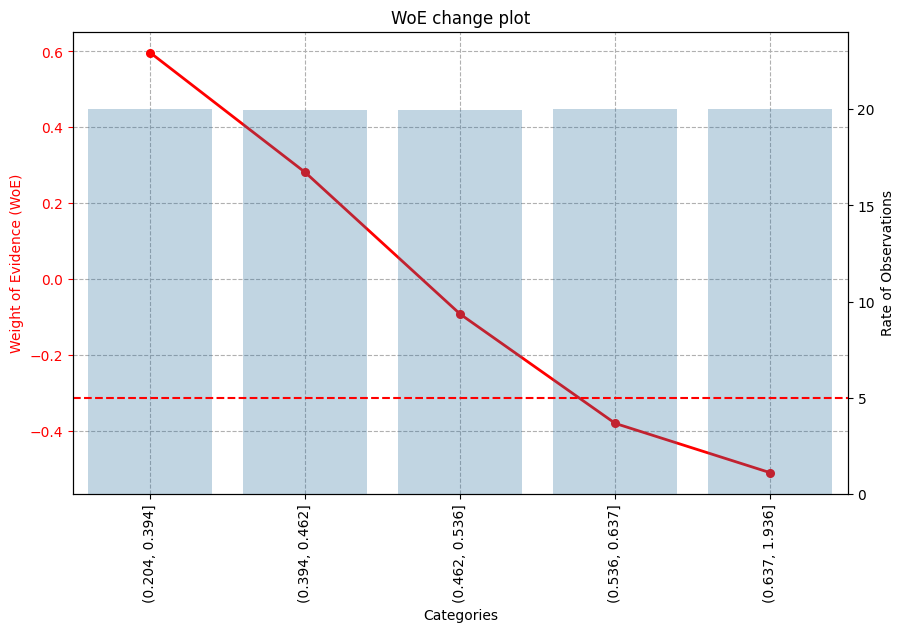

In [ ]:
train_df['cholesterol_ratio_cat'] = pd.qcut(train_df['cholesterol_ratio'], q=5, duplicates='drop')
test_df['cholesterol_ratio_cat'] = pd.qcut(test_df['cholesterol_ratio'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'cholesterol_ratio_cat', 'smoking', sort=False)
view_WoE(woe_df, 'cholesterol_ratio_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('cholesterol_ratio_cat')['rank'].to_dict()
train_df['cholesterol_ratio_rank'] = train_df['cholesterol_ratio_cat'].map(rank_dict)
test_df['cholesterol_ratio_rank'] = test_df['cholesterol_ratio_cat'].map(rank_dict)

train_df.drop(columns=['cholesterol_ratio_cat'], axis=1, inplace=True)
test_df.drop(columns=['cholesterol_ratio_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'cholesterol_ratio_rank')

#### Waist_Height_Ratio

In [ ]:
train_df['Waist_Height_Ratio'] = train_df['waist(cm)'] / train_df['height(cm)']
test_df['Waist_Height_Ratio'] = test_df['waist(cm)'] / test_df['height(cm)']

show_plot(train_df, test_df, 'Waist_Height_Ratio')

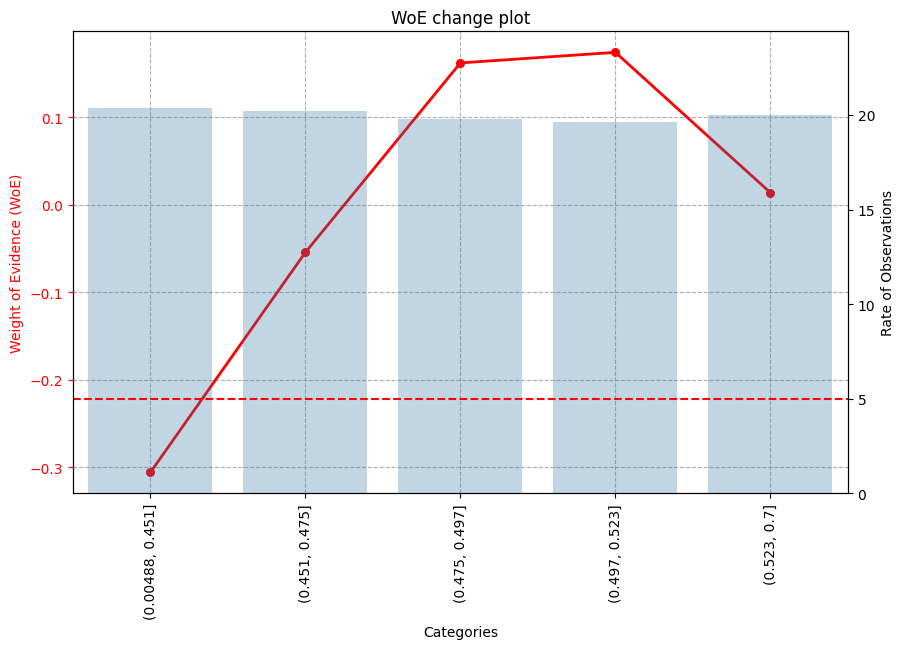

In [ ]:
train_df['Waist_Height_Ratio_cat'] = pd.qcut(train_df['Waist_Height_Ratio'], q=5, duplicates='drop')
test_df['Waist_Height_Ratio_cat'] = pd.qcut(test_df['Waist_Height_Ratio'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'Waist_Height_Ratio_cat', 'smoking', sort=False)
view_WoE(woe_df, 'Waist_Height_Ratio_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('Waist_Height_Ratio_cat')['rank'].to_dict()
train_df['Waist_Height_Ratio_rank'] = train_df['Waist_Height_Ratio_cat'].map(rank_dict)
test_df['Waist_Height_Ratio_rank'] = test_df['Waist_Height_Ratio_cat'].map(rank_dict)

train_df.drop(columns=['Waist_Height_Ratio_cat'], axis=1, inplace=True)
test_df.drop(columns=['Waist_Height_Ratio_cat'], axis=1, inplace=True)
show_plot(train_df, test_df, 'Waist_Height_Ratio_rank')

#### Hemoglobin_GTP_Ratio

In [ ]:
train_df['Hemoglobin_GTP_Ratio'] = train_df['hemoglobin'] / train_df['Gtp']
test_df['Hemoglobin_GTP_Ratio'] = test_df['hemoglobin'] / test_df['Gtp']

show_plot(train_df, test_df, 'Hemoglobin_GTP_Ratio')

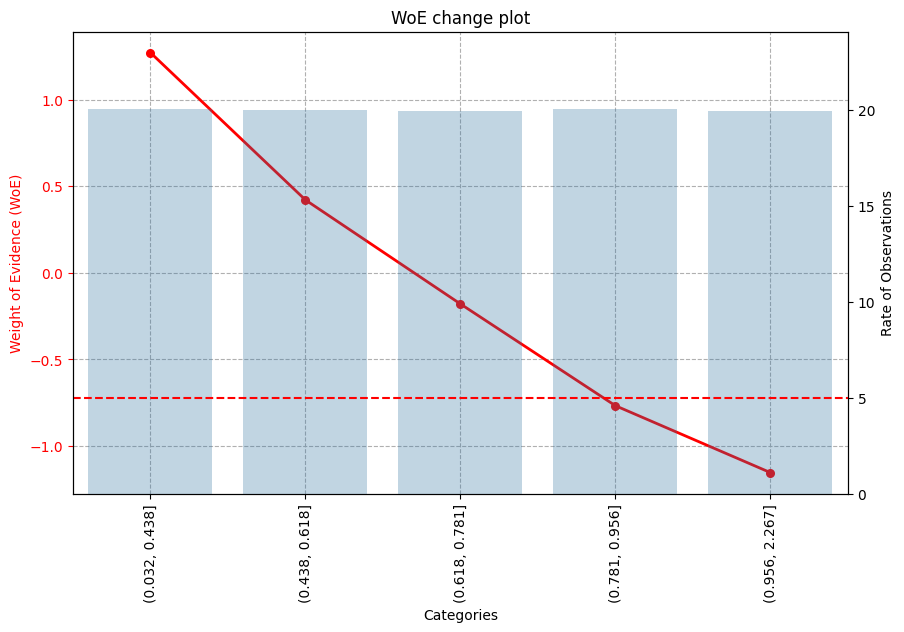

In [ ]:
train_df['Hemoglobin_GTP_Ratio_cat'] = pd.qcut(train_df['Hemoglobin_GTP_Ratio'], q=5, duplicates='drop')
test_df['Hemoglobin_GTP_Ratio_cat'] = pd.qcut(test_df['Hemoglobin_GTP_Ratio'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'Hemoglobin_GTP_Ratio_cat', 'smoking', sort=False)
view_WoE(woe_df, 'Hemoglobin_GTP_Ratio_cat', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('Hemoglobin_GTP_Ratio_cat')['rank'].to_dict()
train_df['Hemoglobin_GTP_Ratio_rank'] = train_df['Hemoglobin_GTP_Ratio_cat'].map(rank_dict)
test_df['Hemoglobin_GTP_Ratio_rank'] = test_df['Hemoglobin_GTP_Ratio_cat'].map(rank_dict)

train_df.drop(columns=['Hemoglobin_GTP_Ratio_cat'], axis=1, inplace=True)
test_df.drop(columns=['Hemoglobin_GTP_Ratio_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'Hemoglobin_GTP_Ratio_rank')

#### Blood_Pressure_Category

In [ ]:
def categorize_bp(systolic):
    if systolic < 120:
        return 'Normal'
    elif 120 <= systolic < 130:
        return 'Elevated'
    # elif 130 <= systolic < 140:
    #     return 'Hypertension Stage 1'
    else:
        return 'Hypertension Stage 2'

train_df['Blood_Pressure_Category'] = train_df['systolic'].apply(categorize_bp)
test_df['Blood_Pressure_Category'] = test_df['systolic'].apply(categorize_bp)

show_plot(train_df, test_df, 'Blood_Pressure_Category')

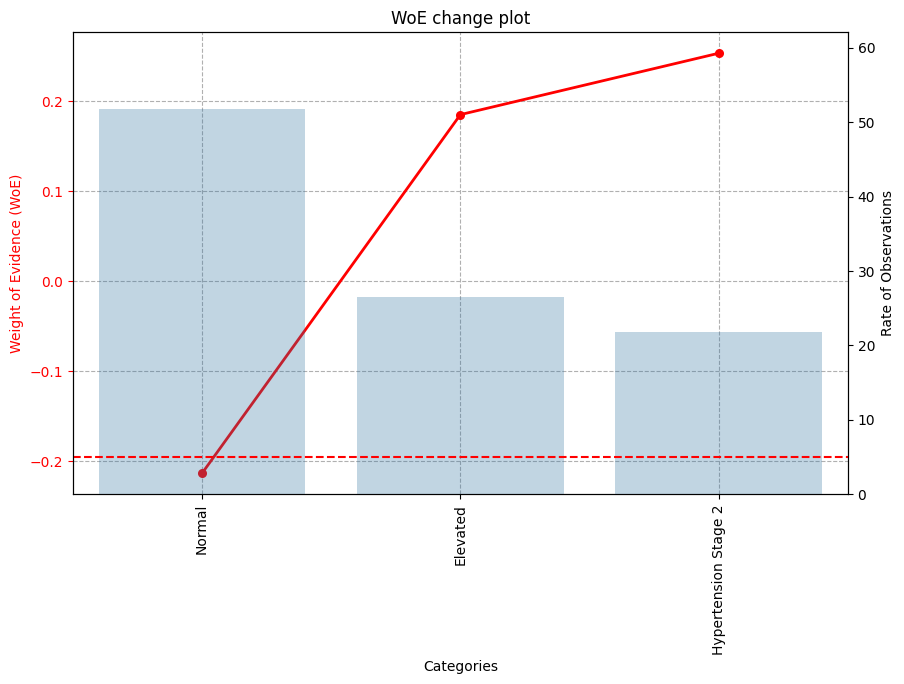

In [ ]:
woe_df = get_WoE(train_df, 'Blood_Pressure_Category', 'smoking', sort=True)
view_WoE(woe_df, 'Blood_Pressure_Category', plotly=False)

In [ ]:
rank_dict = woe_df.set_index('Blood_Pressure_Category')['rank'].to_dict()

train_df['Blood_Pressure_Category_rank'] = train_df['Blood_Pressure_Category'].map(rank_dict)
test_df['Blood_Pressure_Category_rank'] = test_df['Blood_Pressure_Category'].map(rank_dict)

train_df.drop(columns=['Blood_Pressure_Category'], axis=1, inplace=True)
test_df.drop(columns=['Blood_Pressure_Category'], axis=1, inplace=True)

show_plot(train_df, test_df, 'Blood_Pressure_Category_rank')

#### Liver_Enzyme_Ratio

In [ ]:
train_df['Liver_Enzyme_Ratio'] = train_df['AST'] / train_df['ALT']
test_df['Liver_Enzyme_Ratio'] = test_df['AST'] / test_df['ALT']

show_plot(train_df, test_df, 'Liver_Enzyme_Ratio')

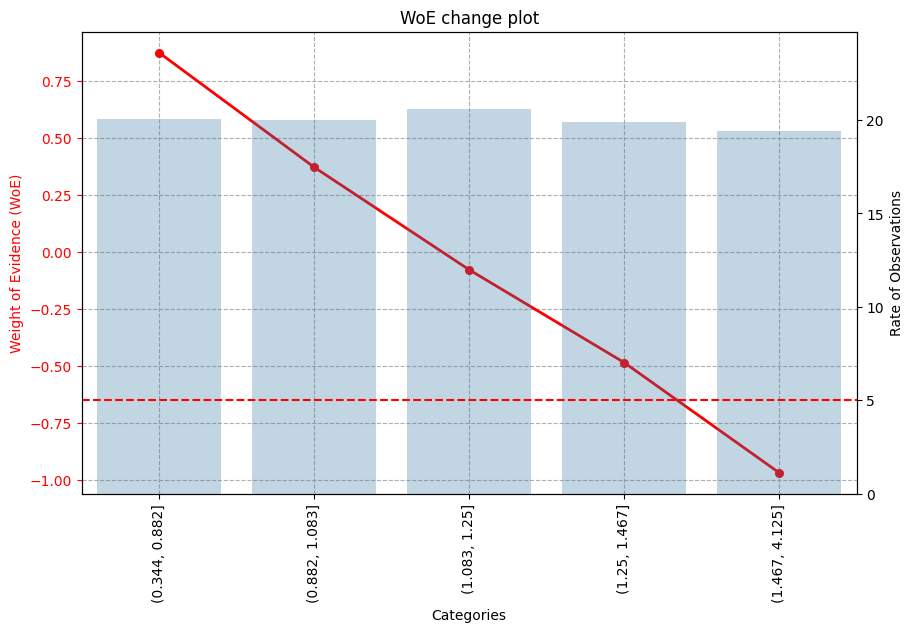

In [ ]:
train_df['Liver_Enzyme_Ratio_cat'] = pd.qcut(train_df['Liver_Enzyme_Ratio'], q=5, duplicates='drop')
test_df['Liver_Enzyme_Ratio_cat'] = pd.qcut(test_df['Liver_Enzyme_Ratio'], q=5, duplicates='drop')

woe_df = get_WoE(train_df, 'Liver_Enzyme_Ratio_cat', 'smoking', sort=False)
view_WoE(woe_df, 'Liver_Enzyme_Ratio_cat', plotly=False)


In [ ]:
rank_dict = woe_df.set_index('Liver_Enzyme_Ratio_cat')['rank'].to_dict()
train_df['Liver_Enzyme_Ratio_rank'] = train_df['Liver_Enzyme_Ratio_cat'].map(rank_dict)
test_df['Liver_Enzyme_Ratio_rank'] = test_df['Liver_Enzyme_Ratio_cat'].map(rank_dict)

train_df.drop(columns=['Liver_Enzyme_Ratio_cat'], axis=1, inplace=True)
test_df.drop(columns=['Liver_Enzyme_Ratio_cat'], axis=1, inplace=True)

show_plot(train_df, test_df, 'Liver_Enzyme_Ratio_rank')

### Model selection

*Analyzing sklearn models on the dataset through learning curves.*

In [ ]:
X = train_df.drop('smoking', axis=1)
y_train = train_df['smoking']
stf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

#### Linear Model

##### LogisticRegression

In [ ]:
logistek_model = LogisticRegression()

logistek_res = learning_curve(
    logistek_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(logistek_res)

##### RidgeClassifier

In [ ]:
ridge_model = RidgeClassifier()

ridge_res = learning_curve(
    ridge_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(ridge_res)

##### SGDClassifier

In [ ]:
sgd_model = SGDClassifier()

sgd_res = learning_curve(
    sgd_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(sgd_res)

##### Perceptron

In [ ]:
percetion_model = Perceptron()

percetion_res = learning_curve(
    percetion_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(percetion_res)

##### PassiveAggressiveClassifier

In [ ]:
passive_model = PassiveAggressiveClassifier()

passive_res = learning_curve(
    passive_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(passive_res)

#### Naive Bayes model

##### GaussianNB

In [ ]:
gaussin_model = GaussianNB()

gaussin_res = learning_curve(
    gaussin_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(gaussin_res)

##### MultinomialNB

In [ ]:
multinomial_model = MultinomialNB()

multinomial_res = learning_curve(
    multinomial_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 1), n_jobs=-1)

show_curve_plot(multinomial_res)

##### BernoulliNB

In [ ]:
bernoulli_model = BernoulliNB()

bernoulli_res = learning_curve(
    bernoulli_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(bernoulli_res)

##### ComplementNB

In [ ]:
complementnb_model = ComplementNB()

complementnb_res = learning_curve(
    complementnb_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(complementnb_res)

#### Neighbors Model

##### KNeighborsClassifier

In [ ]:
knn_model = KNeighborsClassifier(n_neighbors=30)

knn_res = learning_curve(
    knn_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(knn_res)

##### NearestCentroid

In [ ]:
nearest_centroid_model = NearestCentroid()

nearest_centroid_res = learning_curve(
    nearest_centroid_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(nearest_centroid_res)

#### SVM model

##### SVC

In [ ]:
svc_model = SVC()

svc_res = learning_curve(
    svc_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.e0, 10)
)

show_curve_plot(svc_res)

##### LinearSVC model

In [ ]:
linearsvc_model = LinearSVC()

linearsvc_res = learning_curve(
    linearsvc_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(linearsvc_res)

##### NuSVC Model

In [ ]:
nusvc_model = NuSVC()

nusvc_res = learning_curve(
    nusvc_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(nusvc_res)

#### Tree models

##### DecisionTreeClassifier model

In [ ]:
tree_model = DecisionTreeClassifier(max_depth=6)

tree_res = learning_curve(
    tree_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(tree_res)

#### Ensemble Model

##### RandomForestClassifier Model

In [ ]:
randomforest_model = RandomForestClassifier(max_depth=5)

randomforest_res = learning_curve(
    randomforest_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(randomforest_res)

##### GradientBoostingClassifier Model



In [ ]:
gradient_model = GradientBoostingClassifier()

gradient_res = learning_curve(
    gradient_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(gradient_res)

##### AdaBoostClassifier Models

In [ ]:
adaboost_model = AdaBoostClassifier()

adaboost_res = learning_curve(
    adaboost_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(adaboost_res)

###### BaggingClassifier Model

In [ ]:

bagging_model = BaggingClassifier()

bagging_res = learning_curve(
    bagging_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(bagging_res)

##### ExtraTreesClassifier Model

In [ ]:
extratree_model = ExtraTreesClassifier(max_depth=5)

extratree_res = learning_curve(
    extratree_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)


show_curve_plot(extratree_res)

#### Discriminant Analysis Model

##### LinearDiscriminantAnalysis Model

In [ ]:
lineard_model = LinearDiscriminantAnalysis()

lineard_res = learning_curve(
    lineard_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(lineard_res)

##### QuadraticDiscriminantAnalysis Model

In [ ]:
quadratid_model = QuadraticDiscriminantAnalysis()

quadratid_res = learning_curve(
    quadratid_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(quadratid_res)

#### Neural Network

##### MLPClassifier Model

In [ ]:
mlp_model = MLPClassifier()

mlp_res = learning_curve(
    mlp_model, X, y_train, cv=stf, scoring='roc_auc',
    train_sizes=np.linspace(0.1, 1.0, 10)
)

show_curve_plot(mlp_res)